## Lab 6: Quasi-Geostrophic Cyclone Development
In this week's lab, we will use archived GFS model and surface observation data to create surface, 500 hPa and 300 hPa analyses, from which we will use the Pettersen-Sutcliffe Development equation and the QG height tendency equation to investigate a midlatitude cyclone's lifecycle. 
<br />

<br />

### Useful Documentation
1. Xarray open_dataset:  https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html
2. Matplotlib Contour: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html
3. Matplotlib Quiver: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.quiver.html
4. Cartopy Feature: https://scitools.org.uk/cartopy/docs/latest/matplotlib/feature_interface.html
5. MetPy Units: https://unidata.github.io/MetPy/latest/tutorials/unit_tutorial.html
6. Datetime: https://docs.python.org/3/library/datetime.html
7. Scipy Gaussian Filter: https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html
8. Scipy Griddata function: https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.griddata.html
9. Metpy Station Plot: https://unidata.github.io/MetPy/latest/examples/plots/Station_Plot.html



<br />

### Part I Instructions
So that you can complete this week's lab, I have locally archived the March 16th, 2023 1200 UTC, March 17th, 2023 1200 UTC, and March 19th, 2023 0000 UTC GFS analyses.  The location of these data is provided for you below, as is the filename convention if you wish to use a datetime object to select your time of interest.  For the surface data, note that you need to use archived surface data from Iowa State as you did in last semester's Lab 5 Part 1.

Create the following maps for March 16th, 2023 1200 UTC, March 17th, 2023 1200 UTC, and March 19th, 2023 0000 UTC:

<ul>
  <li>Surface observations and isobars using Iowa State archived surface observations
  <li>500 hPa absolute vorticity, temperature, wind barbs, and geopotential height
  <li>300 hPa temperature, wind barbs, and geopotential height
</ul>

Be sure your maps follow the "good map" guidelines, and do not forget to import the necessary packages before you start coding.  I've imported the Iowa State observation package for you.

In [1]:
from datetime import datetime
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot, sky_cover
import numpy as np
import cartopy.crs as crs 
import cartopy
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import xarray as xr
from siphon.simplewebservice.iastate import IAStateUpperAir
import sys
from metpy.units import units
import metpy.calc as calc
import pandas as pd
from metpy.io import parse_metar_file
import requests
from scipy.interpolate import griddata
from metpy.calc import reduce_point_density
sys.path.insert(0, '/srv/data/shared_notebooks/Synoptic1-AtmSci360/Modules/')
from min_max import plot_maxmin_points

In [2]:
# This line declares that we would like to look for modules outside the default location.  Here, I specify the extra modules directory
# from within the shared_notebook space for Synoptic I.
sys.path.insert(0, '/srv/data/shared_notebooks/Synoptic1-AtmSci360/Modules/')

# From the iowa_metar module (found in the special path above), import the download_alldata function.
from iowa_metar import download_alldata

In [3]:
def process_upper_air_data(time):
    data_location = "/data/AtmSci360/Synp2/Lab_6/"

    file_name = f"{time:%m%d%y_%H}_gfs.grib2"
  
    model_data = xr.open_dataset(f"{data_location}{time:%m%d%y_%H}_gfs.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})



    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    
    
    
    return model_data

In [4]:
def process_surface_data(time):
    
    data_file = download_alldata(time)


    metar_data = parse_metar_file(data_file, month = time.month, year=time.year)
    
    
    
    metar_data = metar_data.dropna(how='any', subset=['latitude', 'longitude', 'air_pressure_at_sea_level'])
    

    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    

    point_locs = proj.transform_points(crs.PlateCarree(), metar_data['longitude'].values,metar_data['latitude'].values)
    

    new_lon = np.arange(-130,-59.9,0.1)
    new_lat = np.arange(22,65.1,0.1)
    
    

    metar_latitude =metar_data["latitude"].values
    metar_longitude = metar_data["longitude"].values
    
    
    metar_slp = metar_data['air_pressure_at_sea_level'].values
    
    

    new_pressure = griddata((metar_longitude, metar_latitude), metar_slp, (new_lon[None,:], new_lat[:,None]), method='linear')
          

    new_pressure = gaussian_filter(new_pressure, 8)
 
    metar_data = metar_data[reduce_point_density(point_locs, 200000.)]
    
    

    temps = metar_data["air_temperature"].values * units.degC
    metar_data["air_temperature"] = temps.to(units.degF)
    dews=metar_data["dew_point_temperature"].values * units.degC
    metar_data["dew_point_temperature"] = dews.to(units.degF)

    uwind= metar_data["eastward_wind"].values * units.kt
    vwind= metar_data["northward_wind"].values * units.kt
    
 
    return metar_data, new_pressure, new_lat, new_lon, proj

In [5]:
def plot_surface(metar_data, time, pressure_grid, lat_grid, lon_grid, proj):

 
    fig = plt.figure(figsize=(10,15),dpi=300)
    
    ax = plt.subplot(projection = proj)
    

    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
 
    ax.set_extent((-125, -65, 23, 60))
    

    stationplot = StationPlot(ax, metar_data['longitude'].values, metar_data['latitude'].values,
                          clip_on=True, transform=crs.PlateCarree(), fontsize=5)


    stationplot.plot_parameter('NW', metar_data['air_temperature'].values, color='red')
    stationplot.plot_parameter('SW', metar_data["dew_point_temperature"].values,color='darkgreen')
    stationplot.plot_parameter('NE', metar_data['air_pressure_at_sea_level'].values,
                           formatter=lambda v: format(10 * v, '.0f')[-3:])
    stationplot.plot_symbol('C', metar_data['cloud_coverage'].values, sky_cover)
    stationplot.plot_barb(metar_data['eastward_wind'].values, metar_data['northward_wind'].values)



 
    cont_p = plt.contour(lon_grid, lat_grid, pressure_grid, np.arange(0,2000,4),linewidths = 0.5,colors='k',transform=crs.PlateCarree())
    
    
 
    ax.clabel(cont_p, cont_p.levels, fmt=lambda v: format(v, '.0f'),fontsize=6)
    
    

    plot_maxmin_points(ax, lon_grid, lat_grid, pressure_grid, "min", 125, textsize=15, transform=crs.PlateCarree())
    plot_maxmin_points(ax, lon_grid, lat_grid, pressure_grid, "max", 125, textsize=15, transform=crs.PlateCarree())
    
 
  
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
    plt.title(f"Surface Oberservations, Sea Level Pressure (black| hpa)",size=9,weight="bold",loc="left")
  
    

In [6]:
def plot_300_map(time,model_data):
    model_data=model_data.sel(isobaricInhPa=300)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -65, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,30000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-75,40,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)

    
    
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(f"300 hpa Oberservations, Geopotential Height (black| dm), Temperature (red| $\degree$C), Wind (barbs| kt)",size=6,weight="bold",loc="left")            
         


In [7]:
def plot_vort_gh(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -65, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
          
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-40,40,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)

    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$,Temperature(red| $\degree$C) Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=6,weight="bold",loc="left")            
   

Downloading: 2023-03-16 12:00:00


/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


Downloading: 2023-03-17 12:00:00


/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


Downloading: 2023-03-19 00:00:00


/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:982: ShapelyDeprecationWarning: Iterati

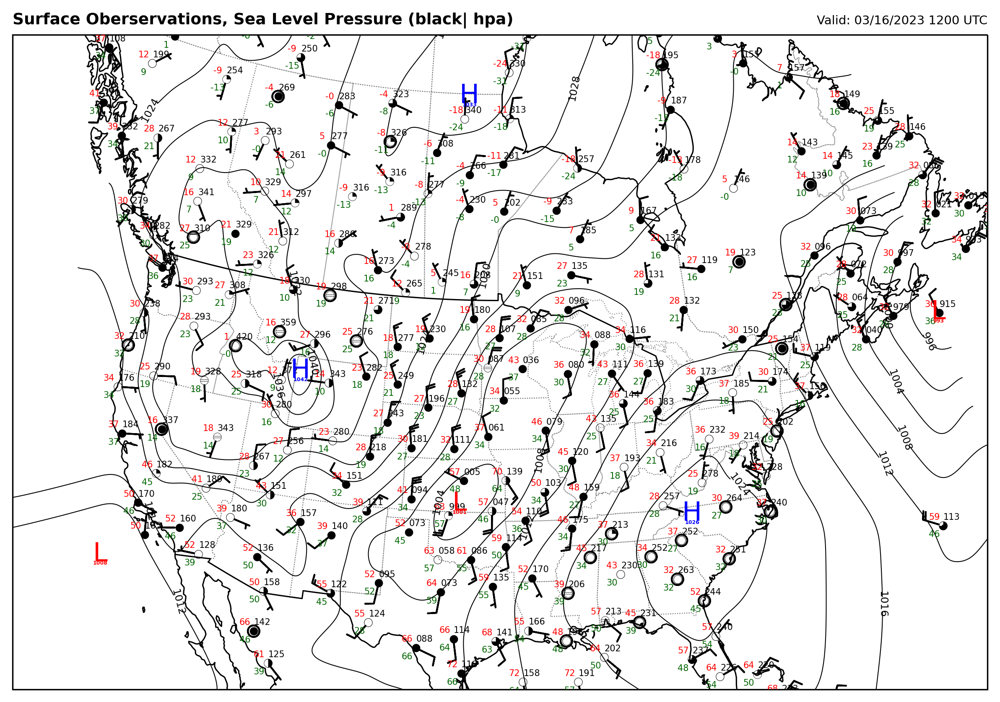

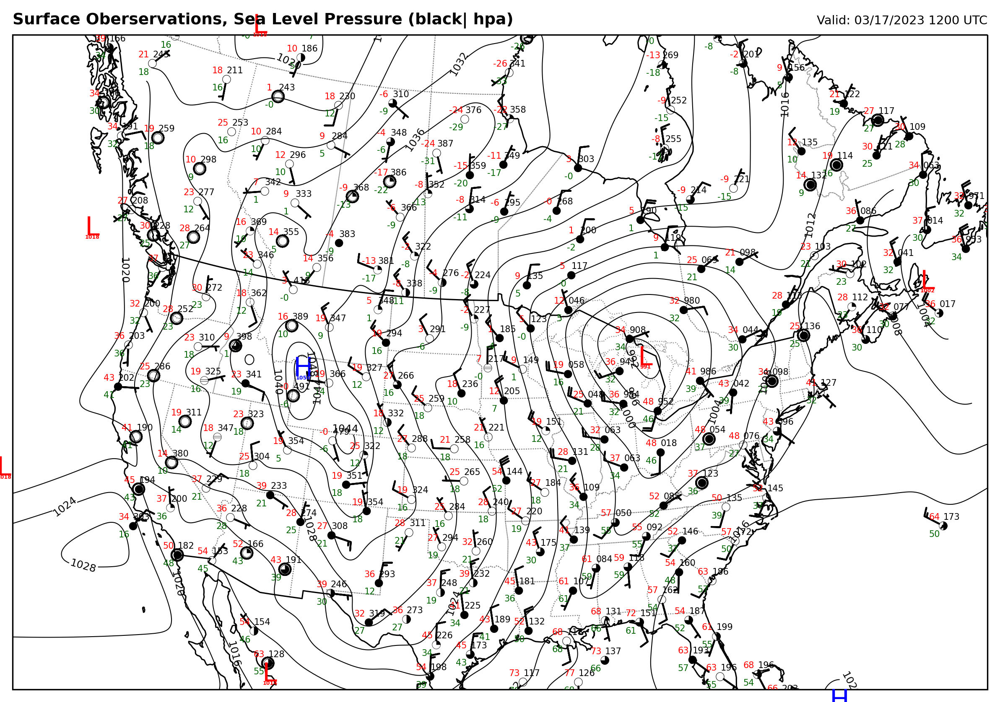

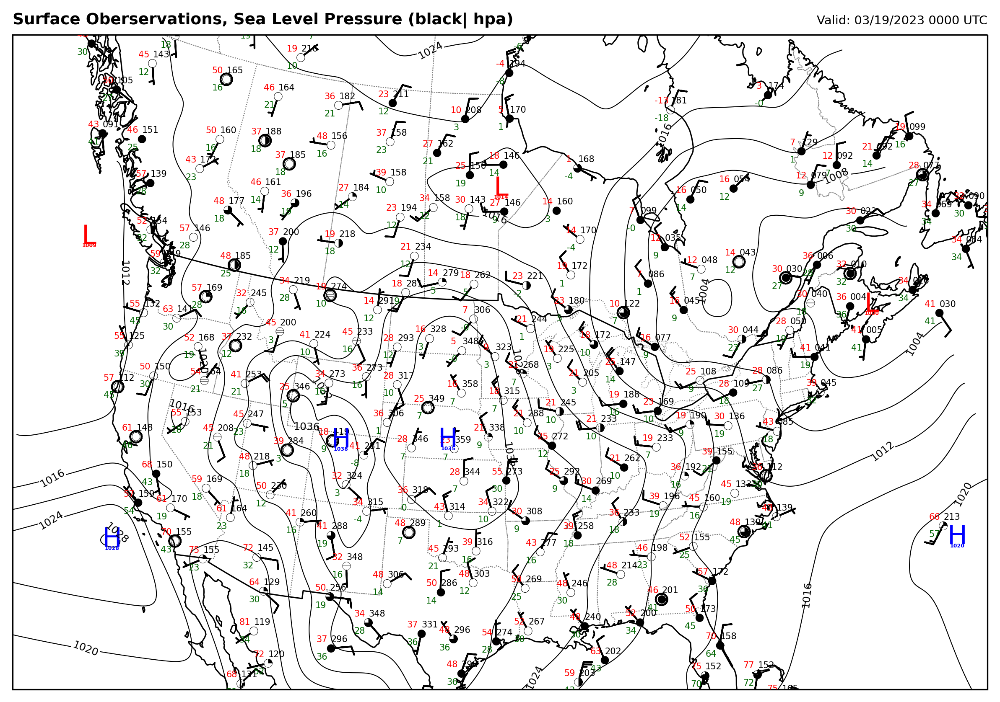

In [8]:
time=datetime(2023,3,16,12)
metar_data, new_pressure, new_lat, new_lon, proj=process_surface_data(time)
plot_surface( metar_data, time, new_pressure, new_lat, new_lon, proj)

time=datetime(2023,3,17,12)
metar_data, new_pressure, new_lat, new_lon, proj=process_surface_data(time)
plot_surface( metar_data, time, new_pressure, new_lat, new_lon, proj)

time=datetime(2023,3,19,0)
metar_data, new_pressure, new_lat, new_lon, proj=process_surface_data(time)
plot_surface( metar_data, time, new_pressure, new_lat, new_lon, proj)

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        

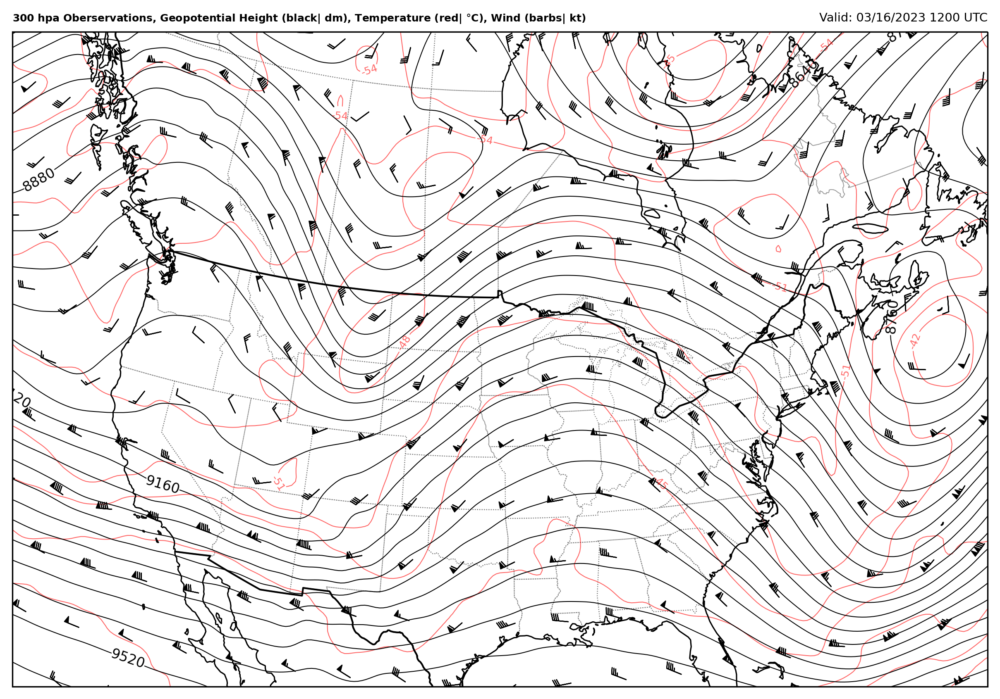

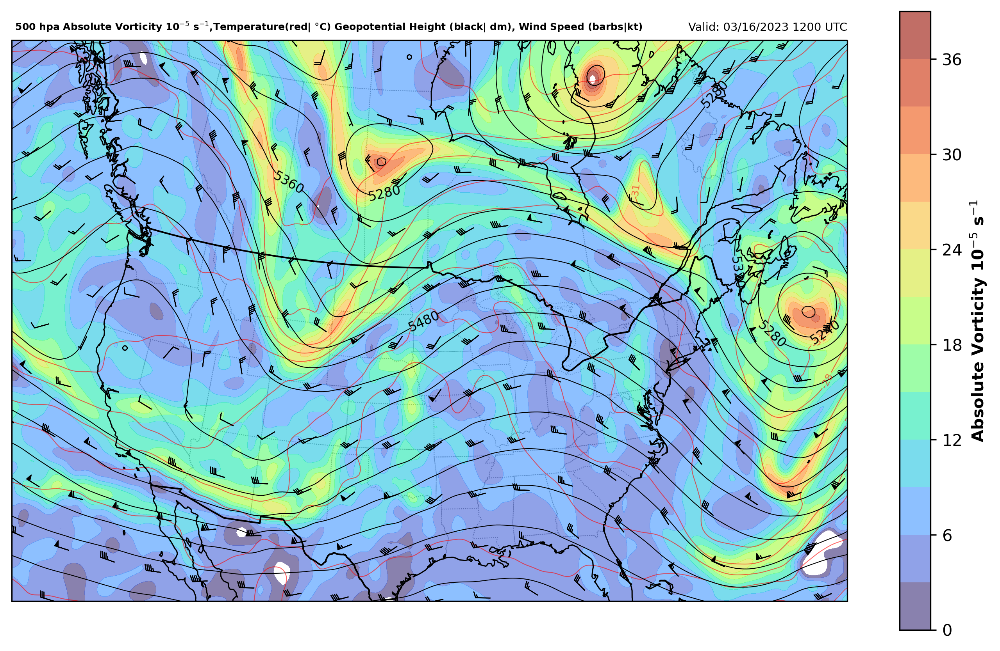

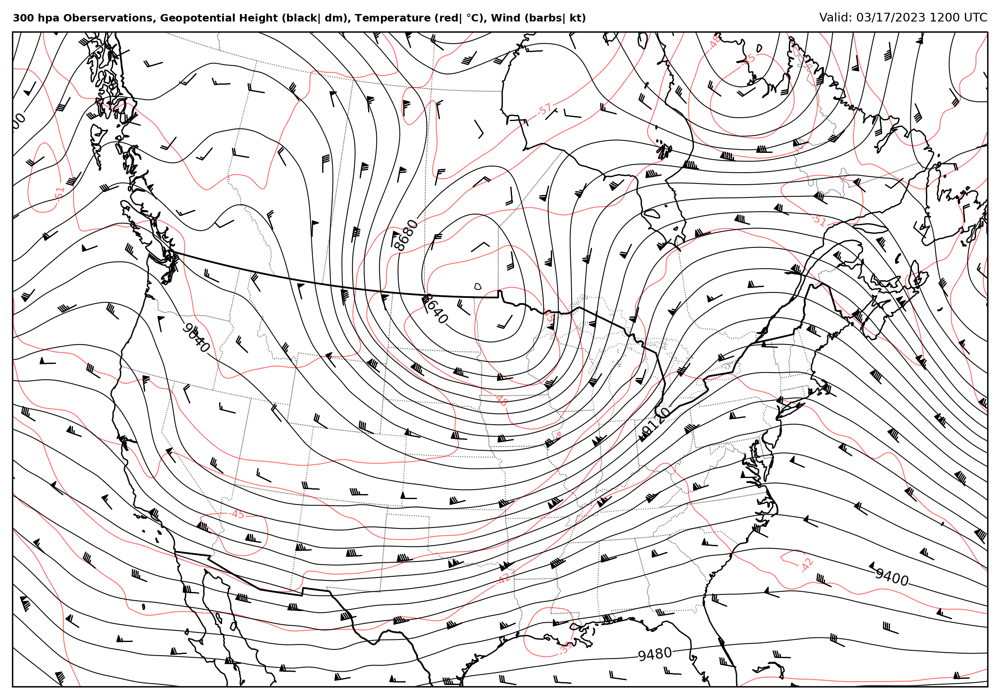

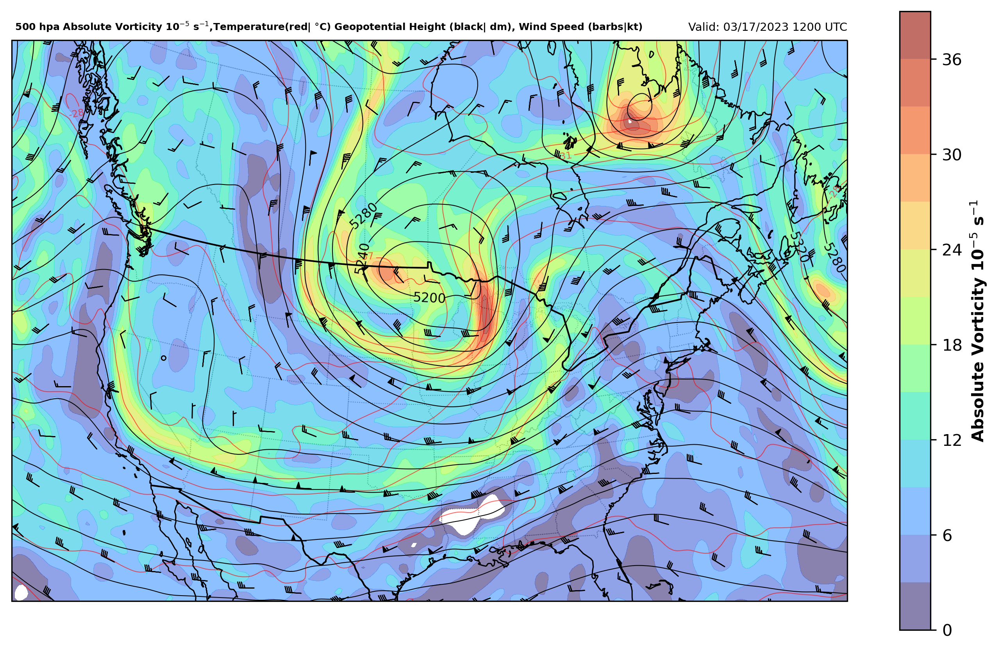

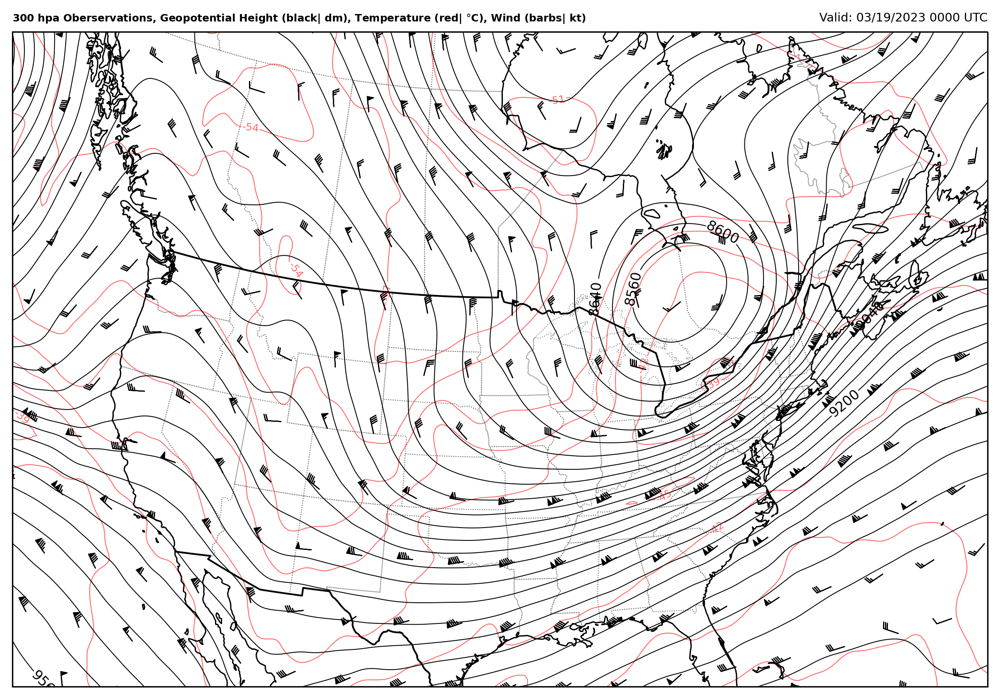

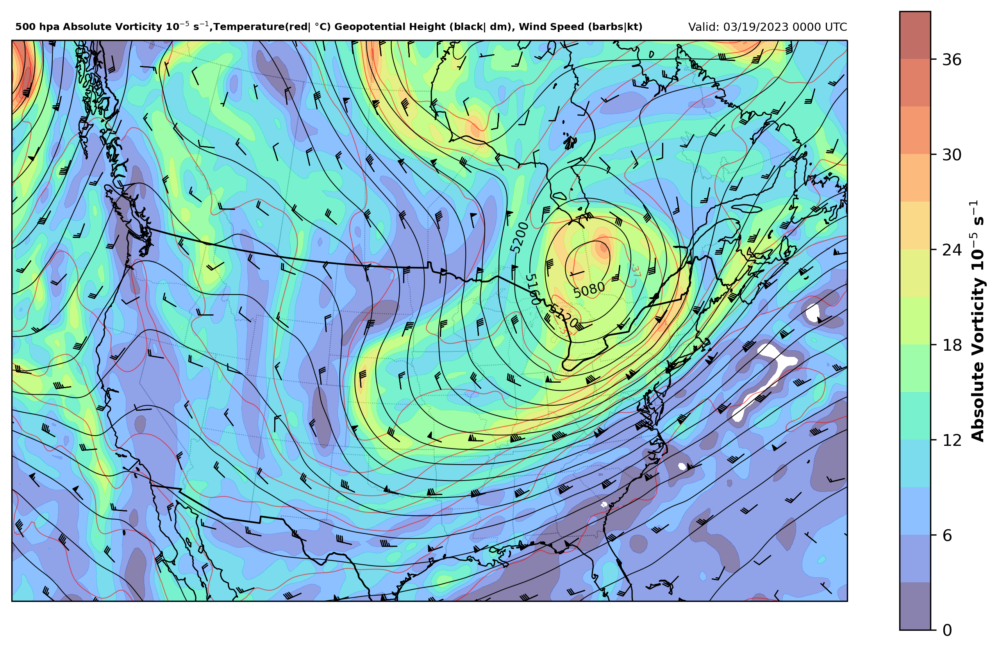

In [9]:
time=datetime(2023,3,16,12)
model_data=process_upper_air_data(time)
plot_300_map(time,model_data)
plot_vort_gh(time, model_data)

time=datetime(2023,3,17,12)
model_data=process_upper_air_data(time)
plot_300_map(time,model_data)
plot_vort_gh(time, model_data)

time=datetime(2023,3,19,0)
model_data=process_upper_air_data(time)
plot_300_map(time,model_data)
plot_vort_gh(time, model_data)

<br />

### Part II Instructions (Graduate Students Only)
I have locally archived the latest GFS analysis (April 5th, 2023 at 1200 UTC).  The location of these data is provided for you below, as is the filename convention if you wish to use a datetime object to select your time of interest. 

Create the following maps using these data:

<ul>
  <li>Surface observations and isobars using Iowa State archived surface observations
  <li>500 hPa absolute vorticity, temperature, wind barbs, and geopotential height
  <li>300 hPa temperature, wind barbs, and geopotential height
</ul>

Be sure your maps follow the "good map" guidelines, and do not forget to import the necessary packages before you start coding.

In [10]:
'''
# variable to specify datetime
time = 

# location of the data
data_location = "/data/AtmSci360/Synp2/Lab_6/"

# naming convention for the GFS data files (if you want to use datetime)
file_name = f"{time:%m%d%y_%H}_gfs.grib2"
'''

'\n# variable to specify datetime\ntime = \n\n# location of the data\ndata_location = "/data/AtmSci360/Synp2/Lab_6/"\n\n# naming convention for the GFS data files (if you want to use datetime)\nfile_name = f"{time:%m%d%y_%H}_gfs.grib2"\n'